# Analysis of full frame calcium signals from dendritic recordings. 
* 4/11/2024 setup
* NOTE asof 4/11/2024 no EEG/EMG data is considered for this analysis. it is based on running/nonrunning events.

In [15]:
from os.path import join
from os import walk
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# from ydata_profiling import ProfileReport
# from src import eeg_class as ec
from src import full_frame_analysis as ffa
from src.classes import database

import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
db = database.ExperimentDatabase()

In [3]:
trials = [927, 935, 934, 929, 936, 931, 937, 932]

In [11]:
# Pairing Tseries path with trial id
# database.pair_imaging_data(
#     "/data2/gergely/invivo_DATA/sleep/140503_3/1_17/TSeries-01172024-0745_dendrites-001/",
#     trial_id=936,
# )
# for trial in trials:
#     print(trial, database.fetch_trial(trial)["tSeries_path"])

927 /data2/gergely/invivo_DATA/sleep/140503_2/1_16/TSeries-01162024-0853_dendrite-001/
935 /data2/gergely/invivo_DATA/sleep/140503_2/1_17/TSeries-01172024-0745_dendrites-001/
934 /data2/gergely/invivo_DATA/sleep/140503_2/1_18/TSeries-01182024-0805-001/
929 /data2/gergely/invivo_DATA/sleep/140503_3/1_16/TSeries-01162024-0853_dendrite-001/
936 /data2/gergely/invivo_DATA/sleep/140503_3/1_17/TSeries-01172024-0745_dendrites-001/
931 /data2/gergely/invivo_DATA/sleep/140502_5/1_16/TSeries-01162024-0853_dendrite-001
937 /data2/gergely/invivo_DATA/sleep/140502_5/1_17/TSeries-01172024-0745_dendrites-001
932 /data2/gergely/invivo_DATA/sleep/140302_3/1_18/TSeries-01182024-0805-003


In [4]:
dendritic_data = []
for trial in trials:
    for dir, subdir, subdirs in walk(database.fetch_trial(trial)["tSeries_path"]):
        # print(subdirs)
        if "reg_tif" in subdir:
            dendritic_data.append(join(dir, "reg_tif"))

In [5]:
dendritic_data

['/data2/gergely/invivo_DATA/sleep/140503_2/1_16/TSeries-01162024-0853_dendrite-001/TSeries-01162024-0853_dendrite-001.sima/s2p_ff/suite2p/plane0/reg_tif',
 '/data2/gergely/invivo_DATA/sleep/140503_2/1_17/TSeries-01172024-0745_dendrites-001/TSeries-01172024-0745_dendrites-001.sima/s2p_ff/suite2p/plane0/reg_tif',
 '/data2/gergely/invivo_DATA/sleep/140503_2/1_18/TSeries-01182024-0805-001/TSeries-01182024-0805-001.sima/s2p_ff/suite2p/plane0/reg_tif',
 '/data2/gergely/invivo_DATA/sleep/140503_3/1_16/TSeries-01162024-0853_dendrite-001/TSeries-01162024-0853_dendrite-001.sima/s2p_ff/suite2p/plane0/reg_tif',
 '/data2/gergely/invivo_DATA/sleep/140503_3/1_17/TSeries-01172024-0745_dendrites-001/TSeries-01172024-0745_dendrites-001.sima/s2p_ff/suite2p/plane0/reg_tif',
 '/data2/gergely/invivo_DATA/sleep/140502_5/1_16/TSeries-01162024-0853_dendrite-001/TSeries-01162024-0853_dendrite-001.sima/s2p_ff/suite2p/plane0/reg_tif',
 '/data2/gergely/invivo_DATA/sleep/140502_5/1_17/TSeries-01172024-0745_dendrit

In [ ]:
# ProfileReport(raw_ff_data, title="Profiling Report")

In [6]:
def open_and_convert(path):
    raw_ff_data = pd.read_csv(join(path, "ff_data.csv"))
    return raw_ff_data.convert_dtypes()

In [8]:
# bandpass filter parameters
lowcut = 0.01
highcut = 0.035
fs = 10.0

# power calculation
window_size = 64  # Number of samples in each window for calculating power
step_size = 32  # Step size for moving the window

dendritic_power = {
    "path": [],
    "mob_power": [],
    "immob_power": [],
}

for path in dendritic_data:
    raw_ff_data = open_and_convert(path)
    raw_ff_data["Padded_Filtered_DeltaF_F"] = ffa.bandpass_filter_with_padding(
        raw_ff_data["DeltaF_F"], lowcut, highcut, fs, order=3, pad_length=500
    )

    times, power = ffa.calculate_power_over_time(
        raw_ff_data["Padded_Filtered_DeltaF_F"].to_numpy(),
        window_size,
        step_size,
        padding_type="symmetric",
    )

    mob_immob_int = raw_ff_data["mob_immob"].astype(int)
    downsampled_mob_immob = ffa.downsample_boolean_signal(mob_immob_int, len(power))
    immob_power = np.mean(power[~downsampled_mob_immob] ** 2)
    mob_power = np.mean(power[downsampled_mob_immob] ** 2)

    dendritic_power["path"].append(path)
    dendritic_power["mob_power"].append(mob_power)
    dendritic_power["immob_power"].append(immob_power)

df_dendritic_power = pd.DataFrame(dendritic_power)

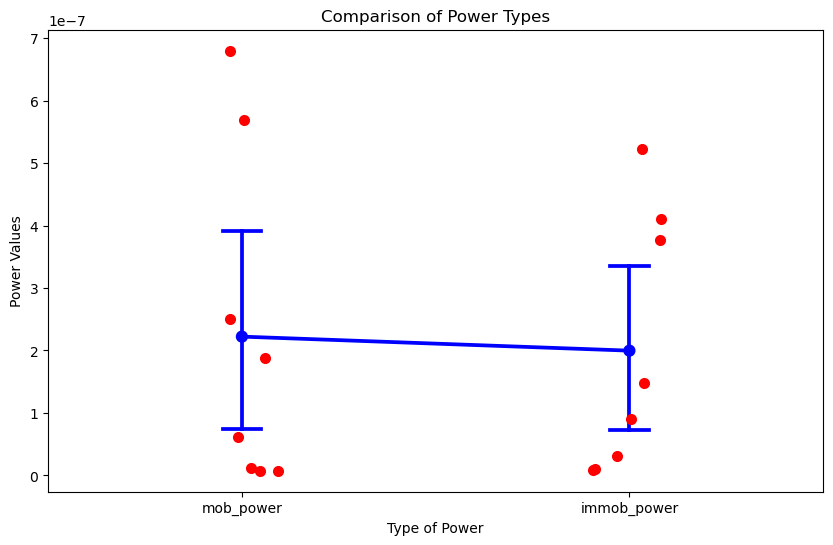

In [9]:
df_long = pd.melt(
    df_dendritic_power,
    id_vars=["path"],
    value_vars=["mob_power", "immob_power"],
    var_name="Power_Type",
    value_name="Value",
)

# Set up a larger plot
plt.figure(figsize=(10, 6))

# Create a pointplot
sns.pointplot(data=df_long, x="Power_Type", y="Value", color="blue", capsize=0.1)

# Overlay with a stripplot for individual data point visibility
sns.stripplot(data=df_long, x="Power_Type", y="Value", color="red", size=8, jitter=True)

# Adding titles and labels
plt.title("Comparison of Power Types")
plt.xlabel("Type of Power")
plt.ylabel("Power Values")

# Show the plot
plt.show()

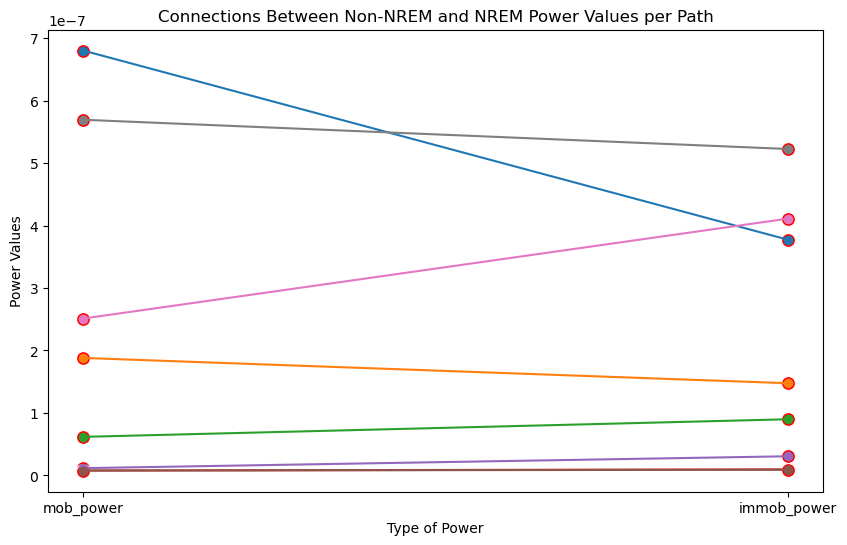

In [10]:
# Create a pivot to have non_nrem and nrem powers side by side for each path
df_pivot = df_long.pivot(index="path", columns="Power_Type", values="Value")
df_pivot.reset_index(inplace=True)

# Set up the plot
plt.figure(figsize=(10, 6))

# Plotting each path's non_nrem and nrem power
for index, row in df_pivot.iterrows():
    plt.plot(
        ["mob_power", "immob_power"],
        [row["mob_power"], row["immob_power"]],
        marker="o",
    )

# Adding scatter for visual emphasis on points
sns.scatterplot(data=df_long, x="Power_Type", y="Value", color="red", s=100)

# Adding titles and labels
plt.title("Connections Between Non-NREM and NREM Power Values per Path")
plt.xlabel("Type of Power")
plt.ylabel("Power Values")

# Show the plot
plt.show()

## Plotting functions 
these work with a single dataset

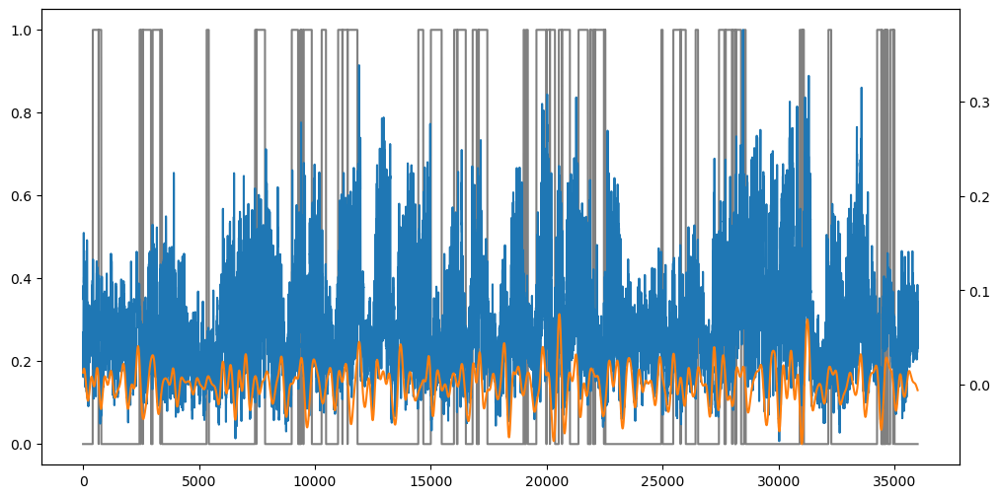

In [11]:
fig, ax1 = plt.subplots(figsize=(12, 6))
ax1.plot(
    raw_ff_data["SequenceIndex"],
    raw_ff_data["mob_immob"],
    label="Mob immob Stage",
    color="grey",
)
ax2 = ax1.twinx()
ax2.plot(raw_ff_data["SequenceIndex"], raw_ff_data["DeltaF_F"])
ax2.plot(raw_ff_data["SequenceIndex"], raw_ff_data["Padded_Filtered_DeltaF_F"])

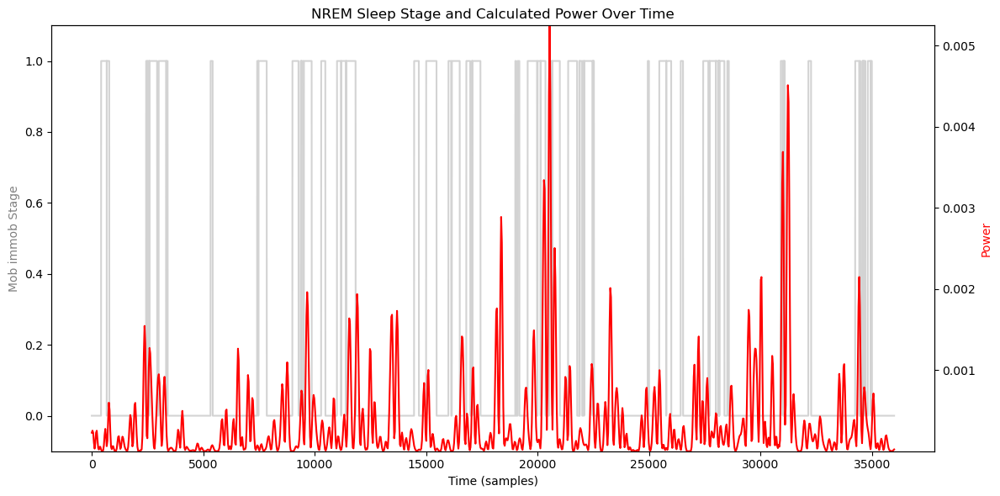

In [12]:
mob_immob_int = raw_ff_data["mob_immob"].astype(int)

total_duration = len(
    raw_ff_data["mob_immob"]
)  # This could be adjusted based on actual time duration or sampling rate
x_nrem = np.linspace(0, total_duration, len(mob_immob_int))

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot NREM data
ax1.plot(x_nrem, mob_immob_int, label="Mob immob Stage", color="lightgrey")

# Assume 'powers' are related to the 'times', plotting as scatter for visual emphasis
ax2 = ax1.twinx()  # Create a second y-axis to plot powers
ax2.plot(times, power, color="red", label="Power over Time")

# Labels and titles
ax1.set_xlabel("Time (samples)")
ax1.set_ylabel("Mob immob Stage", color="grey")
ax2.set_ylabel("Power", color="red")
ax1.set_title("NREM Sleep Stage and Calculated Power Over Time")
ax1.set_ylim(-0.1, 1.1)  # Adjust NREM plot limits for better visibility
ax2.set_ylim([min(power), max(power)])  # Optional: adjust based on your data

# Show plot
fig.tight_layout()  # Adjust layout to make room for the legend
plt.show()

In [14]:
# Convert mob_immob to integers and calculate total duration
mob_immob_int = raw_ff_data["mob_immob"].astype(int)
total_duration = len(
    raw_ff_data["mob_immob"]
)  # This could be adjusted based on actual time duration or sampling rate
x_nrem = np.linspace(0, total_duration, len(mob_immob_int))

# Create a figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add NREM data to the primary y-axis
fig.add_trace(
    go.Scatter(
        x=x_nrem, y=mob_immob_int, name="Mob immob Stage", line=dict(color="lightgrey")
    ),
    secondary_y=False,
)

# Add power data to the secondary y-axis
fig.add_trace(
    go.Scatter(x=times, y=power, name="Power over Time", line=dict(color="red")),
    secondary_y=True,
)

# Add figure title and axis labels
fig.update_layout(
    title_text="NREM Sleep Stage and Calculated Power Over Time",
    xaxis_title="Time (samples)",
)

# Set y-axes titles
fig.update_yaxes(title_text="Mob immob Stage", secondary_y=False, color="grey")
fig.update_yaxes(title_text="Power", secondary_y=True, color="red")

# Adjust y-axis limits if needed (optional)
fig.update_yaxes(
    range=[-0.1, 1.1], secondary_y=False
)  # Adjust for visibility of the NREM plot
fig.update_yaxes(
    range=[min(power), max(power)], secondary_y=True
)  # Optional: adjust based on your data

# Show the plot
fig.show()

In [16]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add "Mob immob Stage" data to the primary y-axis
fig.add_trace(
    go.Scatter(
        x=raw_ff_data["SequenceIndex"],
        y=raw_ff_data["mob_immob"],
        name="Mob immob Stage",
        line=dict(color="grey"),
    ),
    secondary_y=False,
)

# Add "DeltaF_F" data to the secondary y-axis
fig.add_trace(
    go.Scatter(
        x=raw_ff_data["SequenceIndex"],
        y=raw_ff_data["DeltaF_F"],
        name="DeltaF_F",
        line=dict(color="blue"),
    ),
    secondary_y=True,
)

# Add "Padded_Filtered_DeltaF_F" data to the secondary y-axis
fig.add_trace(
    go.Scatter(
        x=raw_ff_data["SequenceIndex"],
        y=raw_ff_data["Padded_Filtered_DeltaF_F"],
        name="Padded_Filtered_DeltaF_F",
        line=dict(color="red"),
    ),
    secondary_y=True,
)

# Add figure title and axis labels
fig.update_layout(
    title_text="Interactive Plot of Mobility, DeltaF_F, and Filtered DeltaF_F Over Sequence Index",
    xaxis_title="Sequence Index",
)

# Set y-axes titles
fig.update_yaxes(title_text="Mob immob Stage", secondary_y=False)
fig.update_yaxes(title_text="DeltaF_F / Padded_Filtered DeltaF_F", secondary_y=True)

# Show the plot
fig.show()